In [1]:
from torch.utils.data import Dataset, DataLoader

import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

from dataset import PineappleDataset
from VAE import VAE

In [2]:
import torch
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def extract_and_visualize_latents(model, test_loader, device='cuda'):
    model.eval()
    model.to(device)

    all_latents = []

    with torch.no_grad():
        for batch in test_loader:
            input_tensor = batch['image'].to(device)

            batch_size, _, height, width = input_tensor.shape
            noise = torch.randn((batch_size, 4, height // 8, width // 8), device=device)
            latent, mean, logvar = model.encoder(input_tensor, noise)

            all_latents.append(latent.squeeze(0).cpu().numpy())

    # Stack latents
    all_latents = np.stack(all_latents)
    print(f"{all_latents.shape[0]} latent vectors extracted")

    # Reshape to 2D and remove NaNs
    reshaped_data = all_latents.reshape(all_latents.shape[0], -1)
    nan_mask = ~np.isnan(reshaped_data).any(axis=1)
    data_cleaned = reshaped_data[nan_mask]

    print(f"Cleaned data shape: {data_cleaned.shape}")

    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=0)
    clustered_data = tsne.fit_transform(data_cleaned)

    # Plot
    plt.figure(figsize=(10, 8))
    plt.scatter(clustered_data[:, 0], clustered_data[:, 1], alpha=0.7)
    plt.title("t-SNE Clustering of Flattened Latents")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
def visualize_reconstructions(model, test_set, num_samples=5, device='cuda'):
    """
    Visualizes original and reconstructed images side by side.
    
    Args:
        model: Trained model with a forward method that returns reconstructions.
        test_set: Dataset providing dicts with 'image' keys.
        num_samples: Number of random samples to display.
        device: 'cuda' or 'cpu'.
    """
    model.eval()
    model.to(device)

    fig = plt.figure(figsize=(4 * num_samples, 8))  # Wide figure
    rows, columns = 2, num_samples  # Original + reconstructed rows

    for i in range(columns):
        index = np.random.randint(len(test_set))

        # Get original image and convert to tensor
        original_image = test_set[index]['image']
        input_tensor = torch.tensor(original_image).unsqueeze(0).to(device)

        # Model inference
        with torch.no_grad():
            reconstructed_image, _, _ = model(input_tensor)

        # Convert images for display
        original_image_disp = (original_image.transpose((1, 2, 0)) * 255).astype(np.uint8)
        reconstructed_image = reconstructed_image.squeeze(0).cpu().numpy()
        reconstructed_image_disp = (reconstructed_image.transpose((1, 2, 0)) * 255).astype(np.uint8)

        # Plot original
        ax = fig.add_subplot(rows, columns, i + 1)
        ax.set_title('Original')
        ax.imshow(original_image_disp)
        ax.axis('off')

        # Plot reconstructed
        ax = fig.add_subplot(rows, columns, i + 1 + columns)
        ax.set_title('Reconstructed')
        ax.imshow(reconstructed_image_disp)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [7]:
test_set = PineappleDataset(train=False, train_ratio=0.0, path="/home/rtxmsi1/Documents/VAE_training-master/FULL_VERTICAL_PINEAPPLE/FULL_UNIFIED")#"./FULL_VERTICAL_PINEAPPLE/FULL_UNIFIED")
test_loader = DataLoader(test_set, batch_size=1, shuffle=False, num_workers=2)

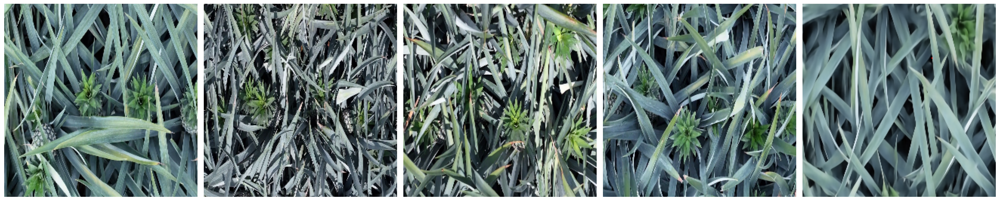

In [8]:
fig = plt.figure(figsize=(24, 6))  # Wider and shorter for horizontal layout
rows = 1
columns = 5

for i in range(columns):
    batch = test_set[np.random.randint(len(test_set))]
    img = batch['image'].transpose((1, 2, 0))  # Convert CHW to HWC
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis for better presentation

plt.tight_layout()
plt.show()

In [38]:
model = VAE()
checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae_perceptual/betaKL@0.25/weights_ck_144.pt"  # Replace with your checkpoint file
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)

<All keys matched successfully>

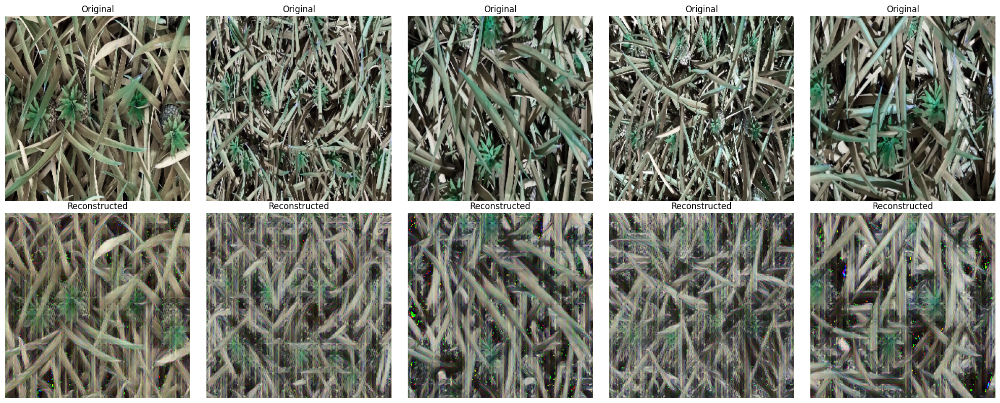

In [39]:
visualize_reconstructions(model, test_set, num_samples=5)

4908 latent vectors extracted
Cleaned data shape: (4908, 4096)


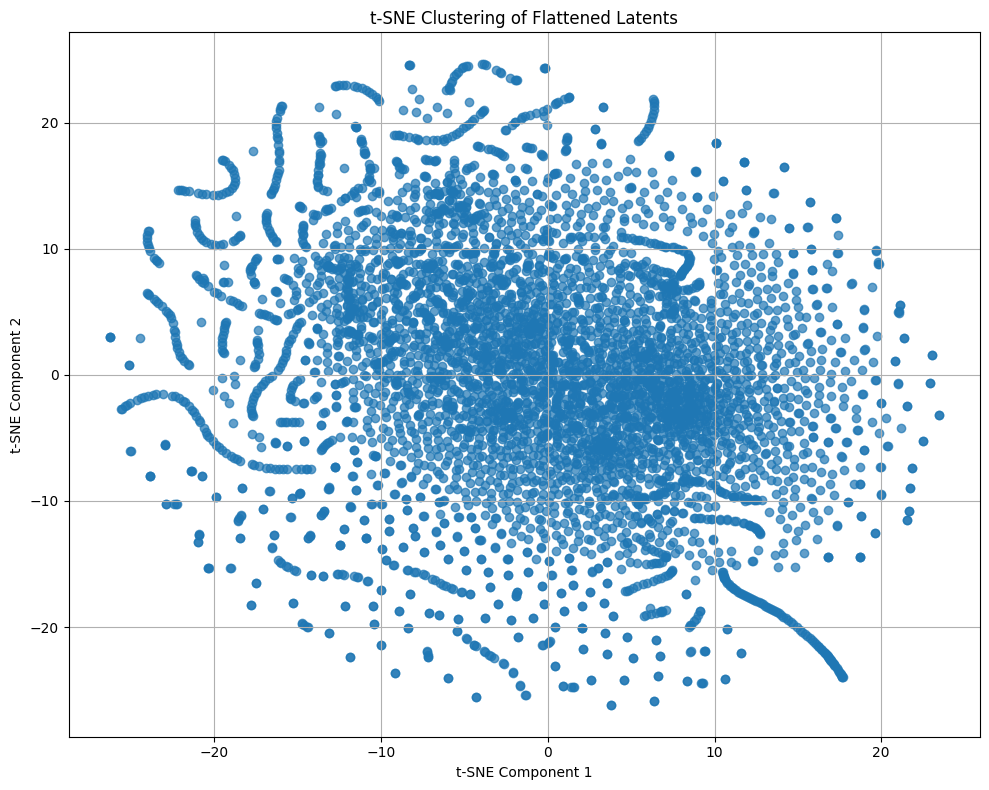

In [33]:
extract_and_visualize_latents(model, test_loader)

In [8]:
model = VAE()
checkpoint_path = "/home/rtxmsi1/Documents/VAE_training-master/checkpoints/vae/betaKL@0.25/weights_ck_199.pt"  # Replace with your checkpoint file
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)

<All keys matched successfully>

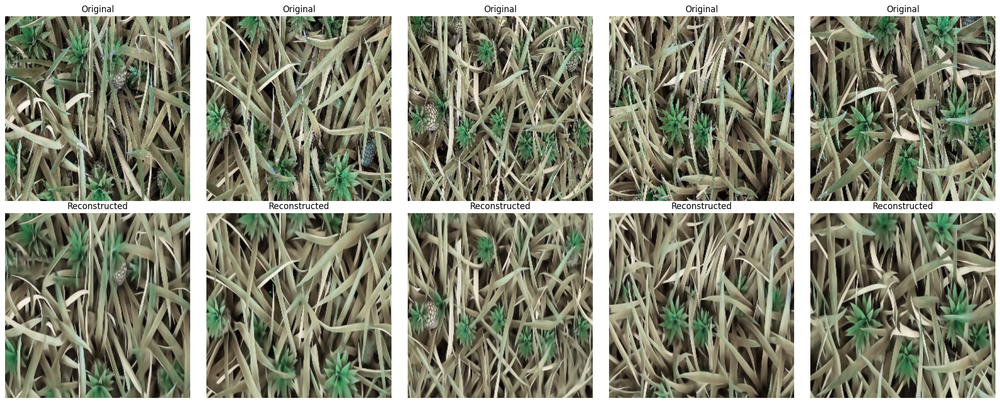

In [9]:
visualize_reconstructions(model, test_set, num_samples=5)

440 latent vectors extracted
Cleaned data shape: (440, 4096)


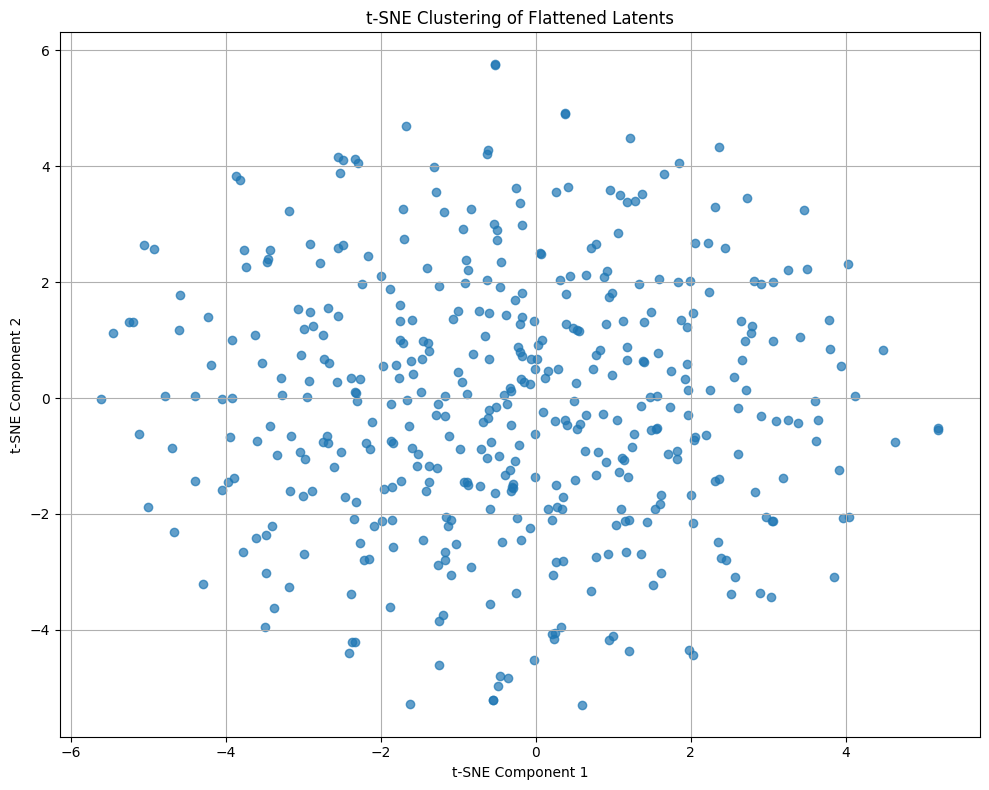

In [10]:
extract_and_visualize_latents(model, test_loader)

In [11]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def visualize_recursive_reconstruction(model, test_set, sample_index=None, t=5, device='cuda'):
    """
    Visualizes the original image, its first reconstruction, and the final result after t recursive reconstructions.

    Args:
        model: Trained model with a forward method that returns reconstructions.
        test_set: Dataset providing dicts with 'image' keys.
        sample_index: Optional index to specify which sample to use. If None, chooses randomly.
        t: Number of recursive reconstruction steps.
        device: 'cuda' or 'cpu'.
    """
    model.eval()
    model.to(device)

    if sample_index is None:
        sample_index = np.random.randint(len(test_set))

    # Get original image
    original_image = test_set[sample_index]['image']
    input_tensor = torch.tensor(original_image).unsqueeze(0).to(device)
    original_image_disp = (original_image.transpose((1, 2, 0)) * 255).astype(np.uint8)

    # First reconstruction
    with torch.no_grad():
        first_recon_tensor, _, _ = model(input_tensor)

    first_recon = first_recon_tensor.squeeze(0).cpu().numpy()
    first_recon_disp = (first_recon.transpose((1, 2, 0)) * 255).astype(np.uint8)

    # Recursive reconstruction t times
    current_tensor = first_recon_tensor
    for _ in range(t):
        with torch.no_grad():
            current_tensor, _, _ = model(current_tensor)

    final_recon = current_tensor.squeeze(0).cpu().numpy()
    final_recon_disp = (final_recon.transpose((1, 2, 0)) * 255).astype(np.uint8)

    # Plot all three
    titles = ['Original', 'First Reconstruction', f'Final after {t} Recursions']
    images = [original_image_disp, first_recon_disp, final_recon_disp]

    plt.figure(figsize=(12, 4))
    for i in range(3):
        ax = plt.subplot(1, 3, i + 1)
        ax.imshow(images[i])
        ax.set_title(titles[i])
        ax.axis('off')

    plt.tight_layout()
    plt.show()



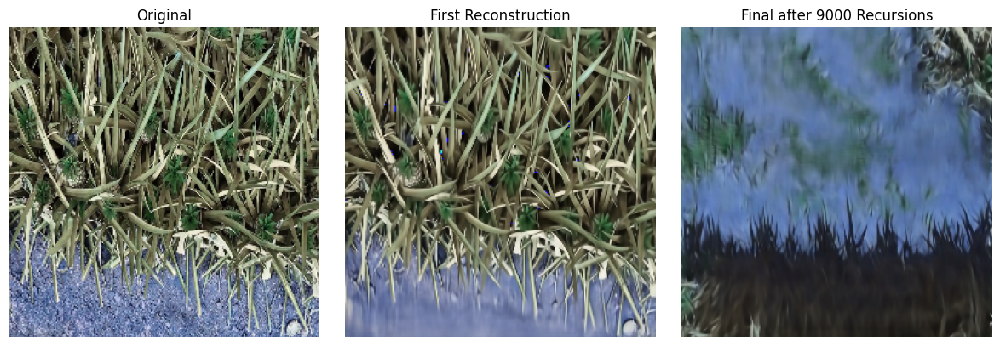

In [19]:
visualize_recursive_reconstruction(model, test_set, sample_index=None, t=9000, device='cuda')